# Deforestation Spread Prediction in TI Koatinemo Using Sentinel-2 and ConvLSTM2D

**Master's Research Thesis — Pipeline Notebook**

This notebook implements an end-to-end pipeline for predicting deforestation spread
direction and intensity within the Koatinemo Indigenous Territory (Terra Indígena
Koatinemo), home to the Asurini do Xingu people in Pará state, Brazilian Amazon.

**Approach:**
1. Sentinel-2 L2A imagery (B08 NIR + B11 SWIR1) is used to compute the Normalized
   Difference Moisture Index (NDMI) across 51 cloud-free observations (2018–2025).
2. A Convolutional LSTM (ConvLSTM2D) is trained to predict the next NDMI state from
   three prior observations, using three input channels: NDMI, temporal spacing, and
   distance to the indigenous territory boundary.
3. Monte Carlo Dropout produces per-pixel uncertainty estimates, enabling
   certainty-scaled directional arrow maps that show *where* deforestation is predicted
   to spread and *how confident* the model is.

All figures are exported as publication-quality PDFs, and a self-contained LaTeX
project is packaged as a ZIP file for direct upload to Overleaf.

---
## 0. Setup and Configuration

Import all required libraries and define global constants. Matplotlib is configured
for publication-quality output (serif fonts, 300 DPI, tight layouts).

In [739]:
import os
import json
import shutil
from pathlib import Path
from collections import defaultdict
from datetime import datetime

import numpy as np
import rasterio
from rasterio.warp import transform as warp_transform
from rasterio.features import geometry_mask
from rasterio.transform import from_bounds
from shapely.geometry import shape, mapping
from shapely.ops import transform as shapely_transform
import pyproj
from scipy.ndimage import distance_transform_edt, sobel, uniform_filter, binary_dilation

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patheffects as pe

# ── Publication-quality matplotlib defaults ──
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 11,
    'axes.titlesize': 13,
    'axes.labelsize': 11,
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.05,
})

# ── Paths ──
BANDS_DIR = Path("Data/bands")
GEOJSON_PATH = Path("Data/ti_koatinemo.geojson")
FIGURES_DIR = Path("figures")
FIGURES_DIR.mkdir(exist_ok=True)

# ── Sentinel-2 cloud masking ──
# SCL classes considered unusable:
#   0=no-data, 1=saturated, 2=dark, 3=cloud-shadow,
#   6=WATER, 8=cloud-med, 9=cloud-high, 10=cirrus, 11=snow
BAD_SCL = {0, 1, 2, 3, 6, 8, 9, 10, 11}

# ── Model hyperparameters ──
PATCH_SIZE = 64        # spatial patch size (pixels)
STRIDE = 96            # patch extraction stride
SEQ_LEN = 4            # 3 input frames + 1 target
NAN_THRESH = 0.15      # max NaN fraction per patch
BATCH_SIZE = 32
LR = 5e-4              # lower LR to reduce overfitting
WEIGHT_DECAY = 1e-4    # L2 regularization
EPOCHS = 100
PATIENCE = 15          # early stopping patience
INPUT_CHANNELS = 3     # NDMI + time_delta + distance_to_boundary
HIDDEN_DIMS = (32, 32) # ConvLSTM hidden channels per layer
DROPOUT_P = 0.3        # higher dropout to combat overfitting
N_MC = 10              # Monte Carlo forward passes

# ── Arrow map ──
DELTA_THRESH = -0.05   # NDMI drop threshold for deforestation
BLOCK_SIZE = 32        # arrow grid resolution (pixels)

# ── Device (MPS for Apple Silicon, CUDA for NVIDIA, CPU fallback) ──
if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

print(f"Device: {DEVICE}")
print(f"Figures will be saved to: {FIGURES_DIR.resolve()}")

Device: mps
Figures will be saved to: /Users/illico/Leti/figures


---
## 1. Data Loading and NDMI Computation

### 1.1 Sentinel-2 Band Data

The satellite imagery comes from the **Sentinel-2 L2A** (surface reflectance) archive,
downloaded via the Element84 Earth Search STAC catalog. For each cloud-free acquisition
date, three bands were downloaded and clipped to the study area:

| Band | Name | Wavelength | Native resolution | Use |
|------|------|-----------|-------------------|-----|
| B08  | NIR  | 842 nm    | 10 m (resampled → 20 m) | Vegetation reflectance |
| B11  | SWIR1| 1610 nm   | 20 m              | Moisture / canopy water content |
| SCL  | Scene Classification | —  | 20 m   | Cloud and shadow masking |

Only dates with ≥ 80% clear pixels (after SCL filtering) were retained during
download, yielding **51 usable observations** spanning June 2018 to August 2025.

In [740]:
# Scan band files and group by date
files = sorted(os.listdir(BANDS_DIR))
date_files = defaultdict(dict)
for f in files:
    if not f.endswith(".tif"):
        continue
    name = f.replace(".tif", "")
    date_str, band = name.rsplit("_", 1)
    date_files[date_str][band] = BANDS_DIR / f

all_dates = sorted(d for d in date_files if {"B08", "B11", "SCL"} <= date_files[d].keys())
print(f"Found {len(all_dates)} dates with B08 + B11 + SCL")
print(f"Date range: {all_dates[0]} to {all_dates[-1]}")

# Load all bands into memory
band_data = {}
for i, date_str in enumerate(all_dates):
    with rasterio.open(date_files[date_str]["B08"]) as src:
        b08 = src.read(1)
        if i == 0:
            raster_meta = src.meta.copy()
            raster_transform = src.transform
            raster_crs = src.crs
            raster_shape = b08.shape
            print(f"Raster shape: {raster_shape} (H x W)")
            print(f"CRS: {raster_crs}")
            print(f"Pixel size: {raster_transform.a:.1f} m")
    with rasterio.open(date_files[date_str]["B11"]) as src:
        b11 = src.read(1)
    with rasterio.open(date_files[date_str]["SCL"]) as src:
        scl = src.read(1)
    band_data[date_str] = {"B08": b08, "B11": b11, "SCL": scl}
    if (i + 1) % 20 == 0 or (i + 1) == len(all_dates):
        print(f"  Loaded {i + 1}/{len(all_dates)}")

print(f"\nAll data loaded. {len(all_dates)} dates ready.")

Found 51 dates with B08 + B11 + SCL
Date range: 2018-06-13 to 2025-08-12
Raster shape: (1605, 1987) (H x W)
CRS: EPSG:32722
Pixel size: 20.0 m
  Loaded 20/51
  Loaded 40/51
  Loaded 51/51

All data loaded. 51 dates ready.


### 1.2 NDMI Computation

The **Normalized Difference Moisture Index** (NDMI) quantifies vegetation water
content and canopy health:

$$\text{NDMI} = \frac{B08_{\text{NIR}} - B11_{\text{SWIR1}}}{B08_{\text{NIR}} + B11_{\text{SWIR1}}}$$

- **NDMI > 0.2**: Healthy, moisture-rich vegetation
- **0 < NDMI < 0.2**: Stressed vegetation
- **NDMI < 0**: Bare soil, burned areas, or non-vegetated surfaces

Cloud-contaminated pixels are identified using the Scene Classification Layer (SCL)
and masked as NaN. We additionally dilate the cloud mask by 3 pixels to remove
haze and thin-cloud edge artifacts.

In [741]:
ndmi_frames = []
valid_masks = []
dates = list(all_dates)

print(f"{'Date':>12s}  {'Mean NDMI':>10s}  {'Std':>6s}  {'Valid%':>7s}  {'Defor%':>7s}")
print("-" * 55)

for date_str in dates:
    entry = band_data[date_str]
    b08 = entry["B08"].astype(np.float32)
    b11 = entry["B11"].astype(np.float32)
    scl = entry["SCL"]

    # Cloud mask + dilation to remove edge artifacts
    bad_mask = np.isin(scl, list(BAD_SCL)) | (b08 == 0)
    bad_mask = binary_dilation(bad_mask, iterations=3)

    denom = b08 + b11
    ndmi = np.where((denom > 0) & ~bad_mask, (b08 - b11) / denom, np.nan)

    valid = ~np.isnan(ndmi)
    ndmi_filled = np.where(valid, ndmi, 0.0).astype(np.float32)

    ndmi_frames.append(ndmi_filled)
    valid_masks.append(valid)

    # Per-date statistics
    if valid.sum() > 0:
        vals = ndmi[valid]
        mean_v = vals.mean()
        std_v = vals.std()
        valid_pct = 100 * valid.sum() / valid.size
        defor_pct = 100 * (vals < 0).sum() / vals.size
        print(f"{date_str:>12s}  {mean_v:>10.4f}  {std_v:>6.4f}  {valid_pct:>6.1f}%  {defor_pct:>6.1f}%")

H, W = raster_shape
print(f"\n{len(ndmi_frames)} NDMI frames computed, shape ({H}, {W})")

        Date   Mean NDMI     Std   Valid%   Defor%
-------------------------------------------------------
  2018-06-13      0.2962  0.0422    95.9%     0.2%
  2018-06-18      0.2982  0.0484    68.6%     0.1%
  2018-06-28      0.2990  0.0443    97.4%     0.3%
  2018-07-03      0.3019  0.0477    90.7%     0.4%
  2018-09-01      0.2794  0.0755    97.4%     1.8%
  2019-06-23      0.3039  0.0434    97.4%     0.2%
  2019-06-28      0.2977  0.0460    96.7%     0.3%
  2019-07-23      0.2976  0.0531    97.1%     0.6%
  2019-08-02      0.2808  0.0642    82.4%     0.8%
  2019-08-07      0.2931  0.0666    91.5%     1.1%
  2019-08-12      0.2871  0.0694    94.6%     1.4%
  2019-09-16      0.2429  0.0912    86.9%     2.8%
  2019-09-21      0.2452  0.0905    95.0%     3.0%
  2019-09-26      0.2388  0.0994    90.4%     3.9%
  2020-01-24      0.3016  0.0585    71.9%     0.6%
  2020-05-28      0.2774  0.0468    81.7%     0.2%
  2020-06-17      0.2736  0.0504    88.8%     0.4%
  2020-06-22      0.2806  

---
## 2. Study Area — Terra Indígena Koatinemo

The **Terra Indígena (TI) Koatinemo** is a federally recognized indigenous territory
in the municipalities of Altamira and Senador José Porfírio, Pará state, Brazil.
It covers approximately **387,834 hectares** of Amazon rainforest and is home to the
**Asurini do Xingu** people.

The territory boundary is sourced from FUNAI (Fundação Nacional dos Povos Indígenas)
and is provided in the SIRGAS 2000 geographic coordinate system (EPSG:4674). We
reproject it to UTM Zone 22S (EPSG:32722) to match the Sentinel-2 raster data.

In [742]:
# Load GeoJSON boundary
with open(GEOJSON_PATH) as f:
    geojson = json.load(f)

feat = geojson["features"][0]
props = feat["properties"]
print("Territory properties:")
for k in ["terrai_nom", "etnia_nome", "municipio_", "uf_sigla", "superficie", "fase_ti"]:
    if k in props:
        print(f"  {k}: {props[k]}")

# Reproject boundary vertices to pixel coordinates
geom = feat["geometry"]
polygons = geom["coordinates"] if geom["type"] == "MultiPolygon" else [geom["coordinates"]]

rings_px = []
for polygon in polygons:
    for ring in polygon:
        lons = [pt[0] for pt in ring]
        lats = [pt[1] for pt in ring]
        xs, ys = warp_transform("EPSG:4674", str(raster_crs), lons, lats)
        inv = ~raster_transform
        cols, rows = zip(*(inv * (x, y) for x, y in zip(xs, ys)))
        rings_px.append((cols, rows))

print(f"\nReprojected {len(rings_px)} boundary ring(s) to pixel coordinates")

Territory properties:
  etnia_nome: Asurini do Xingu
  uf_sigla: PA
  fase_ti: Regularizada

Reprojected 1 boundary ring(s) to pixel coordinates


### Figure 1 — Study Area Map

The last cloud-free NDMI observation overlaid with the TI Koatinemo boundary.
Green areas indicate healthy, moisture-rich vegetation; red areas indicate
degraded or deforested land.

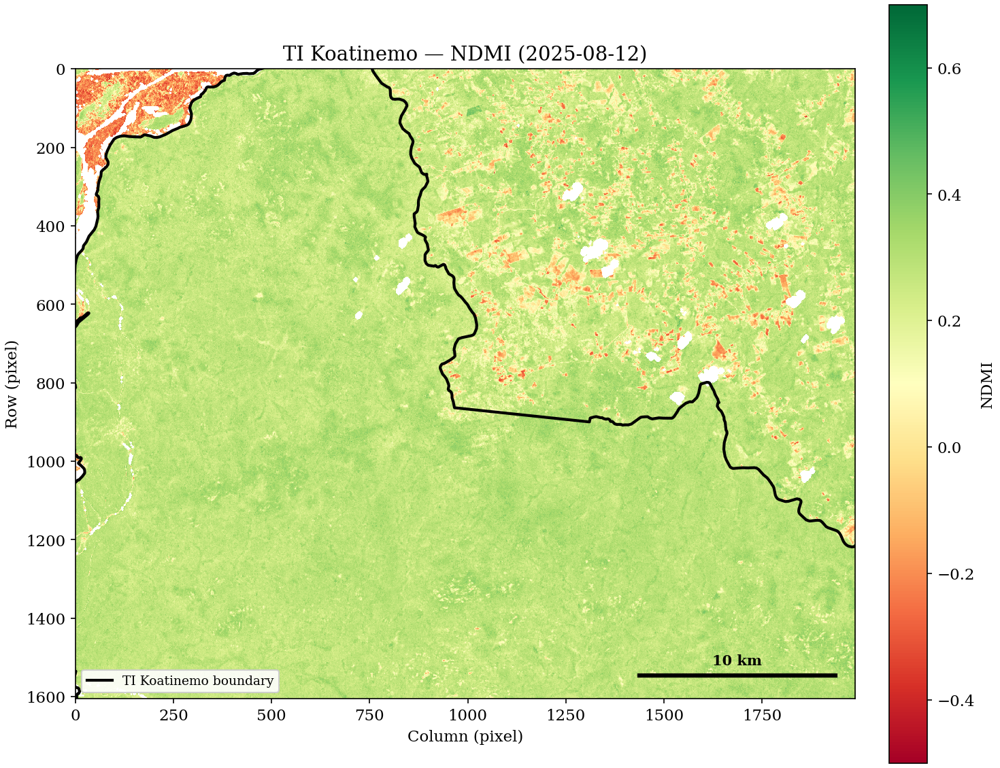

Saved: fig01_study_area.pdf


In [743]:
fig, ax = plt.subplots(figsize=(10, 8))
last_valid_idx = len(dates) - 1
display_ndmi = np.where(valid_masks[last_valid_idx], ndmi_frames[last_valid_idx], np.nan)
im = ax.imshow(display_ndmi, cmap="RdYlGn", vmin=-0.5, vmax=0.7, interpolation="nearest")

for cols, rows in rings_px:
    ax.plot(cols, rows, color="black", linewidth=2, solid_capstyle="round")

ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_title(f"TI Koatinemo — NDMI ({dates[last_valid_idx]})", fontsize=14)
ax.set_xlabel("Column (pixel)")
ax.set_ylabel("Row (pixel)")
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="NDMI")

# Scalebar: 10 km = 500 pixels at 20 m/px
bar_len_px = 500
bar_x = W - bar_len_px - 50
bar_y = H - 60
ax.plot([bar_x, bar_x + bar_len_px], [bar_y, bar_y], color="black", linewidth=3)
ax.text(bar_x + bar_len_px / 2, bar_y - 20, "10 km", ha="center", va="bottom",
        fontsize=10, fontweight="bold")

# Legend
ax.legend([Line2D([0], [0], color="black", lw=2)], ["TI Koatinemo boundary"],
          loc="lower left", fontsize=9, framealpha=0.9)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig01_study_area.pdf")
plt.show()
print("Saved: fig01_study_area.pdf")

---
## 3. Exploratory Data Analysis

### 3.1 Temporal Coverage

Sentinel-2 revisits the equatorial Amazon every ~5 days, but persistent cloud
cover during the wet season (December–May) limits usable acquisitions. The
temporal distribution of our 51 clear observations reflects this bias toward
the dry season (June–November).

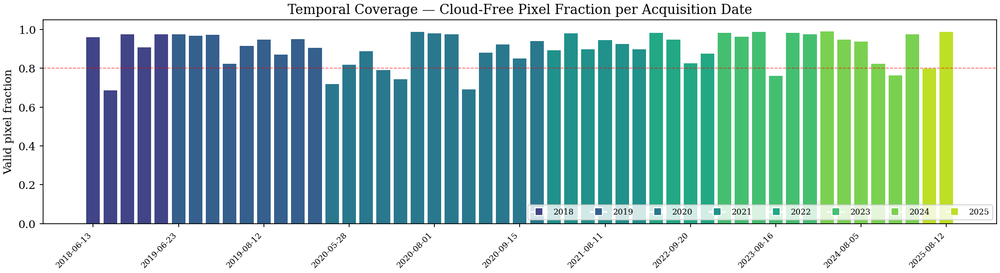

  2018: 5 observations
  2019: 9 observations
  2020: 13 observations
  2021: 6 observations
  2022: 4 observations
  2023: 6 observations
  2024: 6 observations
  2025: 2 observations


In [744]:
# Figure 2: Temporal coverage
valid_fracs = [vm.sum() / vm.size for vm in valid_masks]
years = [int(d[:4]) for d in dates]
unique_years = sorted(set(years))
cmap_years = plt.cm.viridis(np.linspace(0.2, 0.9, len(unique_years)))
year_color = {y: cmap_years[i] for i, y in enumerate(unique_years)}
bar_colors = [year_color[y] for y in years]

fig, ax = plt.subplots(figsize=(14, 4))
x_pos = np.arange(len(dates))
ax.bar(x_pos, valid_fracs, color=bar_colors, edgecolor="none", width=0.8)
ax.set_xticks(x_pos[::5])
ax.set_xticklabels([dates[i] for i in range(0, len(dates), 5)], rotation=45, ha="right", fontsize=8)
ax.set_ylabel("Valid pixel fraction")
ax.set_title("Temporal Coverage — Cloud-Free Pixel Fraction per Acquisition Date")
ax.set_ylim(0, 1.05)
ax.axhline(0.8, color="red", linestyle="--", linewidth=0.8, alpha=0.6, label="80% threshold")

# Year legend
handles = [Line2D([0], [0], marker="s", color="w", markerfacecolor=year_color[y],
                  markersize=8, label=str(y)) for y in unique_years]
ax.legend(handles=handles, loc="lower right", fontsize=8, ncol=len(unique_years))

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig02_temporal_coverage.pdf")
plt.show()

# Print per-year counts
for y in unique_years:
    n = years.count(y)
    print(f"  {y}: {n} observations")

### 3.2 NDMI Time Series

The mean NDMI across all valid pixels tracks the overall vegetation health of
the study area. A declining trend, or increasing fraction of pixels below zero,
indicates progressive deforestation.

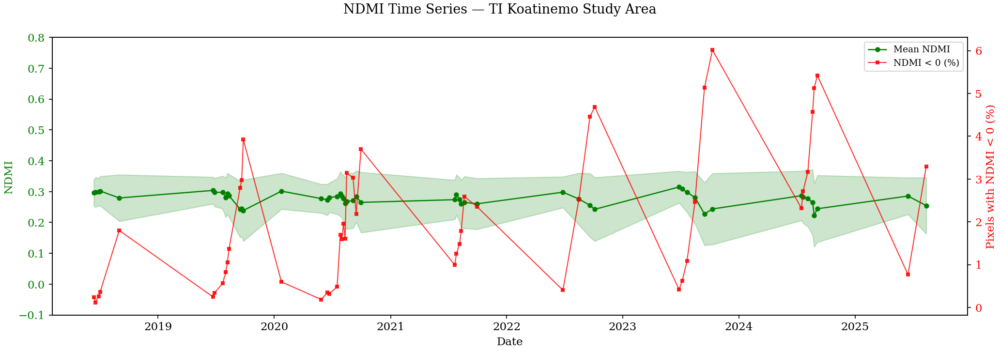

Saved: fig03_ndmi_timeseries.pdf


In [745]:
# Figure 3: NDMI time series
means, stds, defor_fracs = [], [], []
for i, date_str in enumerate(dates):
    ndmi_raw = np.where(valid_masks[i], ndmi_frames[i], np.nan)
    vals = ndmi_raw[valid_masks[i]]
    means.append(vals.mean())
    stds.append(vals.std())
    defor_fracs.append((vals < 0).sum() / vals.size)

dt_dates = [datetime.strptime(d, "%Y-%m-%d") for d in dates]

fig, ax1 = plt.subplots(figsize=(14, 5))
ax1.fill_between(dt_dates, np.array(means) - np.array(stds),
                 np.array(means) + np.array(stds), alpha=0.2, color="green")
ax1.plot(dt_dates, means, "o-", color="green", markersize=4, linewidth=1.2, label="Mean NDMI")
ax1.set_ylabel("NDMI", color="green")
ax1.set_ylim(-0.1, 0.8)
ax1.tick_params(axis="y", labelcolor="green")
ax1.set_xlabel("Date")

ax2 = ax1.twinx()
ax2.plot(dt_dates, np.array(defor_fracs) * 100, "s-", color="red", markersize=3,
         linewidth=1, alpha=0.8, label="NDMI < 0 (%)")
ax2.set_ylabel("Pixels with NDMI < 0 (%)", color="red")
ax2.tick_params(axis="y", labelcolor="red")

fig.suptitle("NDMI Time Series — TI Koatinemo Study Area", fontsize=13)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right", fontsize=9)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig03_ndmi_timeseries.pdf")
plt.show()
print("Saved: fig03_ndmi_timeseries.pdf")

### 3.3 Inside vs. Outside the Indigenous Territory

To quantify the protective effect of the indigenous territory, we compare mean
NDMI values for pixels **inside** vs. **outside** the TI Koatinemo boundary.
We rasterize the boundary polygon to create a binary mask aligned with the
Sentinel-2 grid.

In [746]:
# Rasterize TI boundary to create inside/outside mask
# Reproject the GeoJSON geometry to the raster CRS (EPSG:32722)
project = pyproj.Transformer.from_crs("EPSG:4674", str(raster_crs), always_xy=True).transform
geom_shape = shape(feat["geometry"])
geom_projected = shapely_transform(project, geom_shape)

# Create mask: True = inside TI
ti_mask = ~geometry_mask(
    [mapping(geom_projected)],
    out_shape=raster_shape,
    transform=raster_transform,
    invert=False
)
print(f"TI mask: {ti_mask.sum()} pixels inside ({100 * ti_mask.sum() / ti_mask.size:.1f}%)")
print(f"Outside: {(~ti_mask).sum()} pixels ({100 * (~ti_mask).sum() / ti_mask.size:.1f}%)")

TI mask: 2090750 pixels inside (65.6%)
Outside: 1098385 pixels (34.4%)


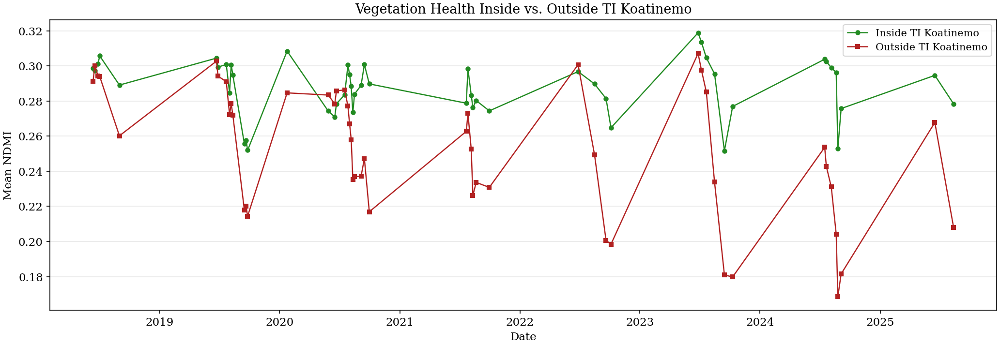

Saved: fig04_inside_outside_ndmi.pdf


In [747]:
# Figure 4: Inside vs outside NDMI
means_in, means_out = [], []
for i in range(len(dates)):
    valid = valid_masks[i]
    ndmi = ndmi_frames[i]
    in_vals = ndmi[valid & ti_mask]
    out_vals = ndmi[valid & ~ti_mask]
    means_in.append(in_vals.mean() if len(in_vals) > 0 else np.nan)
    means_out.append(out_vals.mean() if len(out_vals) > 0 else np.nan)

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(dt_dates, means_in, "o-", color="forestgreen", markersize=4, linewidth=1.2,
        label="Inside TI Koatinemo")
ax.plot(dt_dates, means_out, "s-", color="firebrick", markersize=4, linewidth=1.2,
        label="Outside TI Koatinemo")
ax.set_ylabel("Mean NDMI")
ax.set_xlabel("Date")
ax.set_title("Vegetation Health Inside vs. Outside TI Koatinemo")
ax.legend(fontsize=10)
ax.grid(axis="y", alpha=0.3)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig04_inside_outside_ndmi.pdf")
plt.show()
print("Saved: fig04_inside_outside_ndmi.pdf")

### 3.4 NDMI Change Map (First vs. Last Observation)

To visualize cumulative vegetation change over the study period, we compute
the difference between composites of the last three and first three clear dates.
Negative values (red) indicate NDMI decline consistent with deforestation.

/var/folders/l4/8ms98s3x57b8r7gtd_183_zr0000gn/T/ipykernel_85334/2208624108.py:5: RuntimeWarning: Mean of empty slice
  return np.nanmean(stack, axis=0)


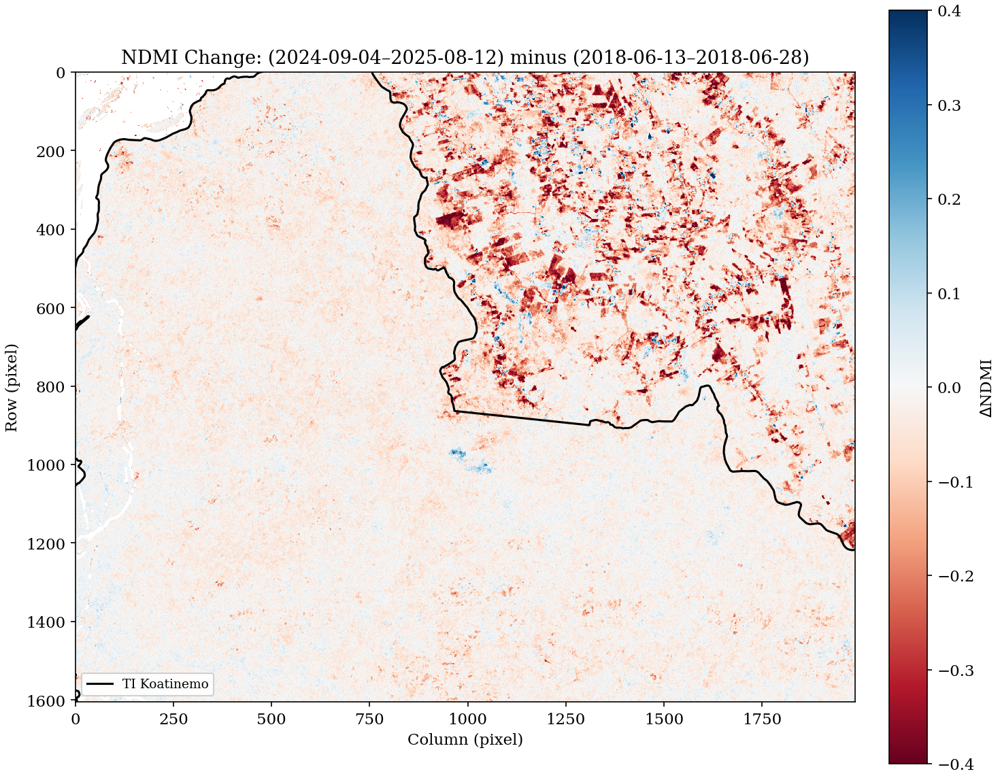

Saved: fig05_ndmi_change.pdf


In [748]:
# Figure 5: NDMI change map
# Composite first and last 3 dates for robustness
def nanmean_stack(frames, masks, indices):
    stack = np.stack([np.where(masks[i], frames[i], np.nan) for i in indices])
    return np.nanmean(stack, axis=0)

first_composite = nanmean_stack(ndmi_frames, valid_masks, [0, 1, 2])
last_composite = nanmean_stack(ndmi_frames, valid_masks, [-3, -2, -1])
ndmi_change = last_composite - first_composite

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(ndmi_change, cmap="RdBu", vmin=-0.4, vmax=0.4, interpolation="nearest")
for cols, rows in rings_px:
    ax.plot(cols, rows, color="black", linewidth=1.5)
ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_title(f"NDMI Change: ({dates[-3]}–{dates[-1]}) minus ({dates[0]}–{dates[2]})")
ax.set_xlabel("Column (pixel)")
ax.set_ylabel("Row (pixel)")
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="$\\Delta$NDMI")
ax.legend([Line2D([0], [0], color="black", lw=1.5)], ["TI Koatinemo"],
          loc="lower left", fontsize=9, framealpha=0.9)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig05_ndmi_change.pdf")
plt.show()
print("Saved: fig05_ndmi_change.pdf")

### 3.5 Classified NDMI — Annual Snapshots

A simplified binary classification: pixels with NDMI ≥ 0 are labeled as
**healthy vegetation** (green), while pixels with NDMI < 0 are labeled as
**deforested / degraded** (red). White pixels represent cloud-masked areas.
One representative date per year is shown.

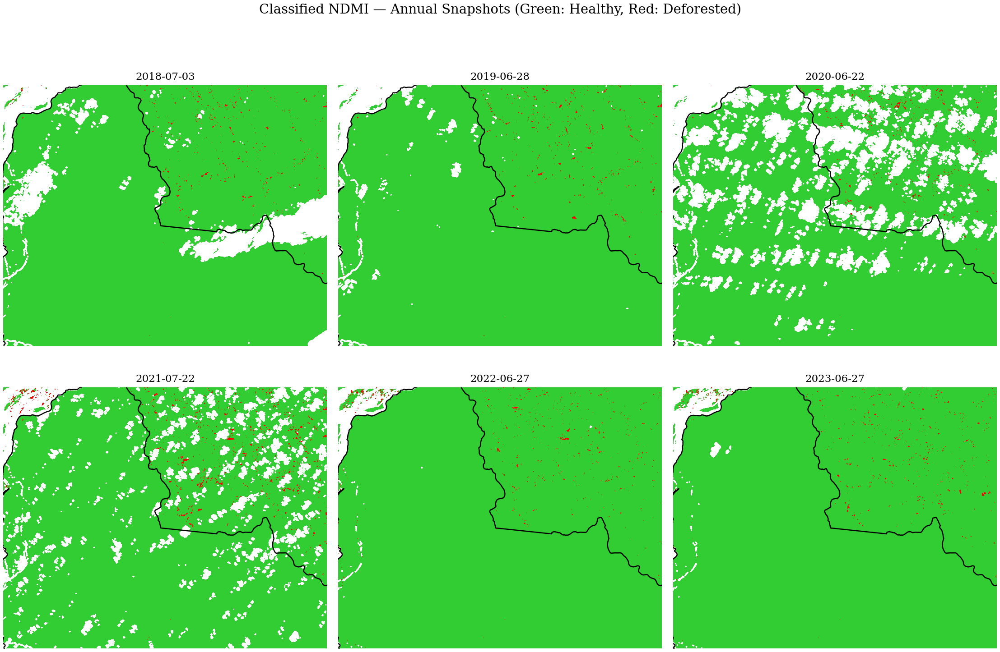

Saved: fig06_ndmi_panels.pdf


In [749]:
# Figure 6: 2x3 classified NDMI panels
# Select one date per year (prefer mid-year for dry season)
selected = []
for y in unique_years:
    year_dates = [(i, d) for i, d in enumerate(dates) if d.startswith(str(y))]
    if year_dates:
        # Pick the date closest to July 1
        target = datetime(y, 7, 1)
        best = min(year_dates, key=lambda x: abs(datetime.strptime(x[1], "%Y-%m-%d") - target))
        selected.append(best)

# Take up to 6
selected = selected[:6]
n_panels = len(selected)
n_rows_fig = (n_panels + 2) // 3

cmap_cls = ListedColormap(["red", "limegreen"])
cmap_cls.set_bad("white")
norm_cls = BoundaryNorm([-1, 0, 1], cmap_cls.N)

fig, axes = plt.subplots(n_rows_fig, 3, figsize=(15, 5 * n_rows_fig))
axes = axes.flatten()

for j, (idx, date_str) in enumerate(selected):
    ndmi_raw = np.where(valid_masks[idx], ndmi_frames[idx], np.nan)
    # Dilate cloud mask for cleaner display
    cloud = np.isnan(ndmi_raw)
    dilated = binary_dilation(cloud, iterations=2)
    ndmi_display = ndmi_raw.copy()
    ndmi_display[dilated] = np.nan

    axes[j].imshow(ndmi_display, cmap=cmap_cls, norm=norm_cls, interpolation="nearest")
    for cols, rows in rings_px:
        axes[j].plot(cols, rows, color="black", linewidth=1.2)
    axes[j].set_xlim(0, W)
    axes[j].set_ylim(H, 0)
    axes[j].set_title(date_str, fontsize=11)
    axes[j].axis("off")

# Hide unused axes
for j in range(n_panels, len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Classified NDMI — Annual Snapshots (Green: Healthy, Red: Deforested)",
             fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig06_ndmi_panels.pdf")
plt.show()
print("Saved: fig06_ndmi_panels.pdf")

---
## 4. Distance-to-Boundary Channel

Deforestation in the Amazon often advances from roads and agricultural frontiers
toward protected areas. The Euclidean distance from each pixel to the nearest
point on the TI Koatinemo boundary encodes this **spatial vulnerability** and
is provided to the model as a static third input channel.

We compute this by:
1. Rasterizing the boundary polygon to a binary edge mask.
2. Applying `scipy.ndimage.distance_transform_edt` to get the distance
   from every pixel to the nearest boundary pixel.
3. Normalizing to $[0, 1]$ by dividing by the maximum distance in the scene.

In [750]:
# Create boundary edge mask from the rasterized TI mask
# Boundary pixels = TI mask XOR eroded TI mask
from scipy.ndimage import binary_erosion

ti_eroded = binary_erosion(ti_mask, iterations=1)
boundary_edge = ti_mask & ~ti_eroded  # 1-pixel-wide boundary

# Distance transform: distance from every pixel to the nearest boundary pixel
# Invert: boundary=0, everything else=1, then EDT gives distance to boundary
dist_raw = distance_transform_edt(~boundary_edge)
dist_meters = dist_raw * 20.0  # pixel size = 20 m

# Normalize to [0, 1]
dist_norm = (dist_raw / dist_raw.max()).astype(np.float32)

print(f"Distance to boundary: min={dist_meters.min():.0f} m, "
      f"max={dist_meters.max():.0f} m, mean={dist_meters.mean():.0f} m")
print(f"Normalized range: [{dist_norm.min():.4f}, {dist_norm.max():.4f}]")

Distance to boundary: min=0 m, max=17636 m, mean=4331 m
Normalized range: [0.0000, 1.0000]


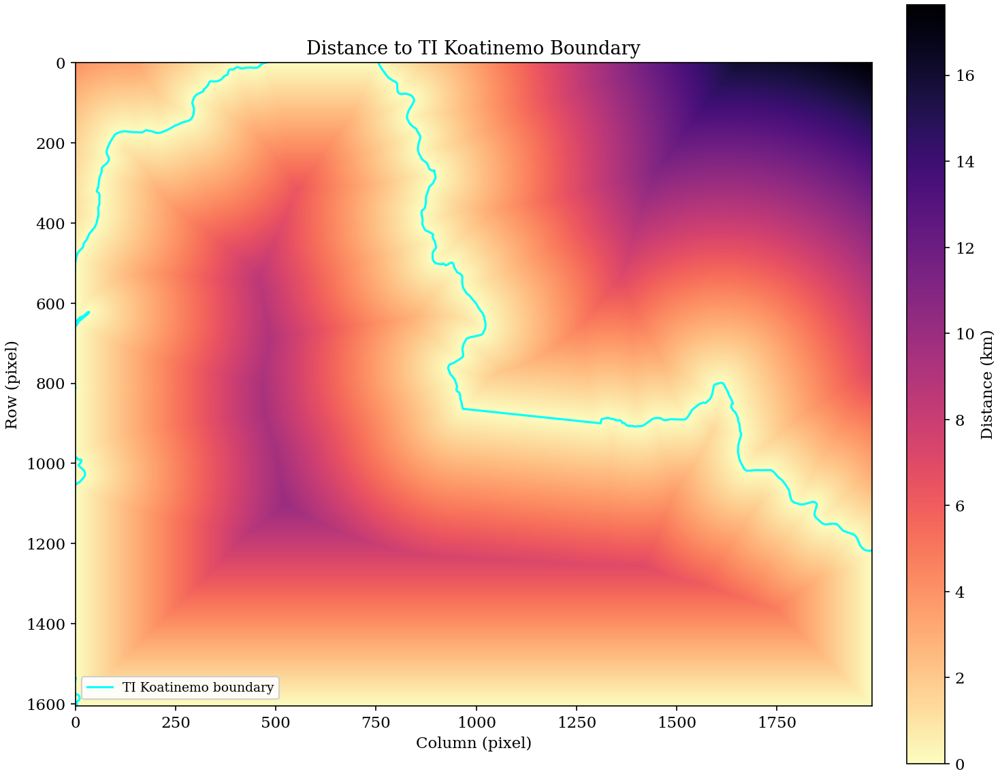

Saved: fig07_distance_boundary.pdf


In [751]:
# Figure 7: Distance-to-boundary heatmap
fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(dist_meters / 1000, cmap="magma_r", interpolation="nearest")
for cols, rows in rings_px:
    ax.plot(cols, rows, color="cyan", linewidth=1.5)
ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_title("Distance to TI Koatinemo Boundary")
ax.set_xlabel("Column (pixel)")
ax.set_ylabel("Row (pixel)")
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Distance (km)")
ax.legend([Line2D([0], [0], color="cyan", lw=1.5)], ["TI Koatinemo boundary"],
          loc="lower left", fontsize=9, framealpha=0.9)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig07_distance_boundary.pdf")
plt.show()
print("Saved: fig07_distance_boundary.pdf")

---
## 5. Dataset Construction

The ConvLSTM operates on **128×128 pixel patches** extracted with a stride of
64 pixels (50% overlap). A sliding window of size 4 moves across the temporal
dimension: the first 3 frames are inputs and the 4th is the prediction target.

Each input frame has **3 channels**:
1. **NDMI** — the vegetation moisture index (cloud-masked pixels set to 0)
2. **Time delta** — normalized days since the previous observation (encodes
   irregular temporal spacing)
3. **Distance to boundary** — static spatial prior (same for every timestep)

Patches with > 50% NaN pixels across their temporal window are discarded.
Training patches are augmented with random horizontal/vertical flips and
90° rotations.

In [752]:
# Compute normalized time deltas
def compute_time_deltas(date_strings):
    dts = [datetime.strptime(d, "%Y-%m-%d") for d in date_strings]
    deltas = [0.0] + [(dts[i] - dts[i - 1]).days for i in range(1, len(dts))]
    deltas = np.array(deltas, dtype=np.float32)
    return deltas / max(deltas.max(), 1.0)

time_deltas = compute_time_deltas(dates)
print(f"Time deltas (normalized): min={time_deltas.min():.3f}, "
      f"max={time_deltas.max():.3f}, mean={time_deltas.mean():.3f}")

def pad_to_multiple(arr, multiple):
    h, w = arr.shape
    ph = (multiple - h % multiple) % multiple
    pw = (multiple - w % multiple) % multiple
    if ph == 0 and pw == 0:
        return arr
    return np.pad(arr, ((0, ph), (0, pw)), mode="constant", constant_values=0)

Time deltas (normalized): min=0.000, max=1.000, mean=0.174


In [753]:
class NDMIPatchDataset(Dataset):
    """Patch-based dataset for ConvLSTM training with 3-channel input."""

    def __init__(self, ndmi_frames, valid_masks, time_deltas, dist_norm,
                 augment=False, temporal_stride=1):
        self.augment = augment
        self.samples = []

        T = len(ndmi_frames)

        # Pad all frames and the distance channel
        frames_padded = [pad_to_multiple(f, PATCH_SIZE) for f in ndmi_frames]
        masks_padded = [pad_to_multiple(m.astype(np.float32), PATCH_SIZE).astype(bool)
                        for m in valid_masks]
        dist_padded = pad_to_multiple(dist_norm, PATCH_SIZE)
        pH, pW = frames_padded[0].shape

        patch_rows = list(range(0, pH - PATCH_SIZE + 1, STRIDE))
        patch_cols = list(range(0, pW - PATCH_SIZE + 1, STRIDE))
        n_patches = len(patch_rows) * len(patch_cols)
        print(f"  Padded: {pH}x{pW}, {n_patches} patches/frame "
              f"({len(patch_rows)}x{len(patch_cols)})")

        # Sliding window over time (with temporal subsampling for speed)
        for t_start in range(0, T - SEQ_LEN + 1, temporal_stride):
            t_end = t_start + SEQ_LEN
            for r in patch_rows:
                for c in patch_cols:
                    total_valid = 0
                    total_pixels = 0
                    for t in range(t_start, t_end):
                        patch_mask = masks_padded[t][r:r+PATCH_SIZE, c:c+PATCH_SIZE]
                        total_valid += patch_mask.sum()
                        total_pixels += PATCH_SIZE * PATCH_SIZE
                    if total_valid / total_pixels < (1 - NAN_THRESH):
                        continue
                    self.samples.append((t_start, t_end, r, c))

        self._frames = frames_padded
        self._masks = masks_padded
        self._deltas = time_deltas
        self._dist = dist_padded
        print(f"  {len(self.samples)} samples (temporal_stride={temporal_stride})")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        t_start, t_end, r, c = self.samples[idx]
        ps = PATCH_SIZE

        # Build 3-channel input sequence: [NDMI, time_delta, distance]
        input_seq = []
        for t in range(t_start, t_end - 1):
            ndmi_patch = self._frames[t][r:r+ps, c:c+ps]
            delta_ch = np.full_like(ndmi_patch, self._deltas[t])
            dist_ch = self._dist[r:r+ps, c:c+ps]
            input_seq.append(np.stack([ndmi_patch, delta_ch, dist_ch], axis=0))
        input_seq = np.stack(input_seq, axis=0)  # (T-1, 3, H, W)

        target = self._frames[t_end - 1][r:r+ps, c:c+ps]
        target_mask = self._masks[t_end - 1][r:r+ps, c:c+ps]
        prev = self._frames[t_end - 2][r:r+ps, c:c+ps]

        if self.augment:
            k = np.random.randint(4)
            flip_h = np.random.random() > 0.5
            flip_v = np.random.random() > 0.5

            def xform(arr):
                if arr.ndim == 3:
                    arr = np.rot90(arr, k, axes=(1, 2)).copy()
                    if flip_h: arr = arr[:, :, ::-1].copy()
                    if flip_v: arr = arr[:, ::-1, :].copy()
                else:
                    arr = np.rot90(arr, k).copy()
                    if flip_h: arr = arr[:, ::-1].copy()
                    if flip_v: arr = arr[::-1, :].copy()
                return arr

            input_seq = np.stack([xform(frame) for frame in input_seq])
            target = xform(target)
            target_mask = xform(target_mask.astype(np.float32)) > 0.5
            prev = xform(prev)

        return (torch.from_numpy(input_seq.copy()).float(),
                torch.from_numpy(target.copy()).float(),
                torch.from_numpy(target_mask.copy()).float(),
                torch.from_numpy(prev.copy()).float())

In [754]:
# Train/validation split: last 2 temporal windows for validation
n_train_windows = len(dates) - SEQ_LEN + 1 - 2
train_end = n_train_windows + SEQ_LEN - 1

print(f"Total frames: {len(dates)}")
print(f"Train frames: indices 0..{train_end - 1} ({train_end} frames, {n_train_windows} windows)")
print(f"Val frames: last {2 + SEQ_LEN - 1} frames ({2} windows)")

print("\nBuilding training dataset:")
train_ds = NDMIPatchDataset(
    ndmi_frames[:train_end], valid_masks[:train_end],
    time_deltas[:train_end], dist_norm, augment=True,
    temporal_stride=2)  # use every 2nd window — more data for longer training

print("\nBuilding validation dataset:")
val_ds = NDMIPatchDataset(
    ndmi_frames[-(2 + SEQ_LEN - 1):], valid_masks[-(2 + SEQ_LEN - 1):],
    time_deltas[-(2 + SEQ_LEN - 1):], dist_norm, augment=False)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=0, pin_memory=False)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=0, pin_memory=False)

print(f"\nTrain: {len(train_ds)} samples, {len(train_loader)} batches")
print(f"Val:   {len(val_ds)} samples, {len(val_loader)} batches")
print(f"Target: ~{len(train_loader) * 0.35:.0f}s/epoch, ~{len(train_loader) * 0.35 * EPOCHS / 60:.0f} min total")

Total frames: 51
Train frames: indices 0..48 (49 frames, 46 windows)
Val frames: last 5 frames (2 windows)

Building training dataset:
  Padded: 1664x2048, 357 patches/frame (17x21)
  6331 samples (temporal_stride=2)

Building validation dataset:
  Padded: 1664x2048, 357 patches/frame (17x21)
  431 samples (temporal_stride=1)

Train: 6331 samples, 198 batches
Val:   431 samples, 14 batches
Target: ~69s/epoch, ~116 min total


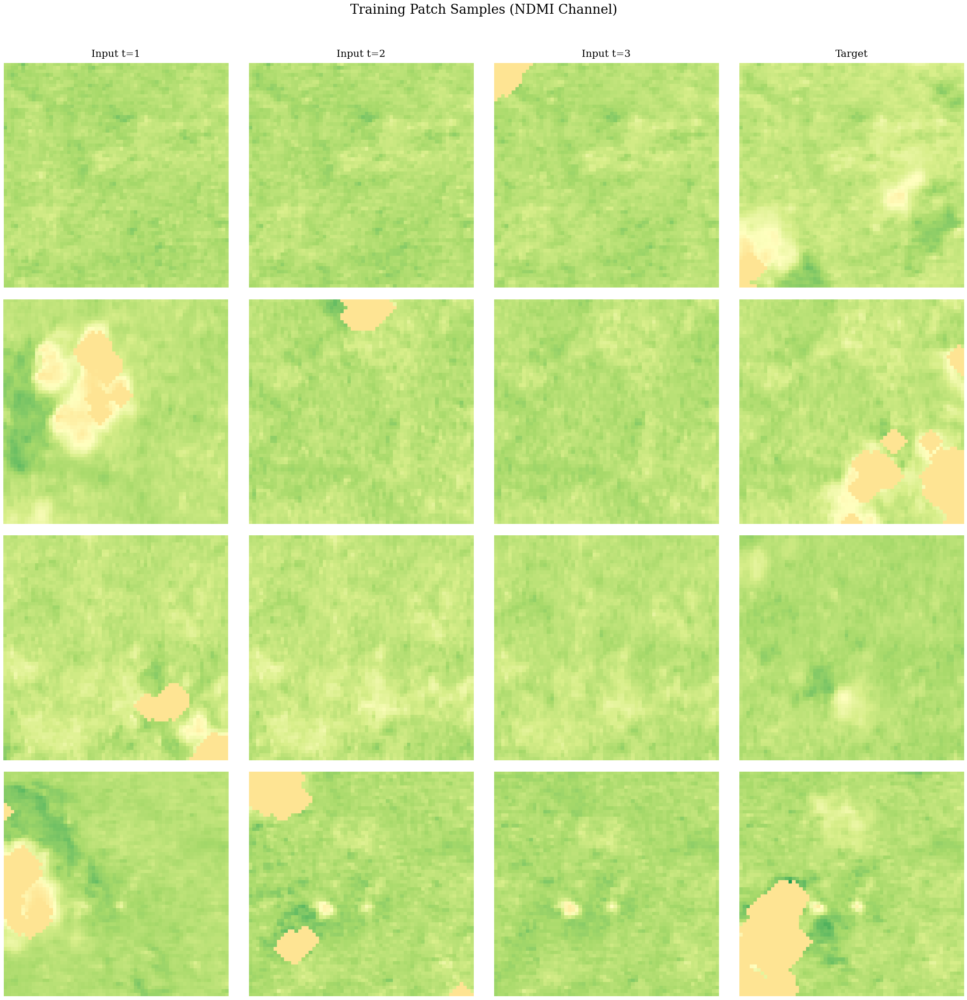

Saved: fig08_sample_patches.pdf


In [755]:
# Figure 8: Sample training patches
fig, axes = plt.subplots(4, 4, figsize=(14, 14))

rng = np.random.RandomState(42)
sample_indices = rng.choice(len(train_ds), size=4, replace=False)

for row, si in enumerate(sample_indices):
    inp, tgt, mask, prev = train_ds[si]
    # inp shape: (3, 3, 128, 128) — 3 timesteps, 3 channels
    for t in range(3):
        axes[row, t].imshow(inp[t, 0].numpy(), cmap="RdYlGn", vmin=-0.5, vmax=0.7)
        axes[row, t].set_title(f"Input t={t+1}" if row == 0 else "", fontsize=10)
        axes[row, t].axis("off")
    axes[row, 3].imshow(tgt.numpy(), cmap="RdYlGn", vmin=-0.5, vmax=0.7)
    axes[row, 3].set_title("Target" if row == 0 else "", fontsize=10)
    axes[row, 3].axis("off")
    axes[row, 0].set_ylabel(f"Sample {row+1}", fontsize=10, rotation=0, labelpad=50)

fig.suptitle("Training Patch Samples (NDMI Channel)", fontsize=13, y=1.01)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig08_sample_patches.pdf")
plt.show()
print("Saved: fig08_sample_patches.pdf")

---
## 6. Model Architecture — ConvLSTM2D

The **Convolutional LSTM** (Shi et al., 2015) extends the standard LSTM by
replacing fully connected gates with convolutional operations, enabling it to
capture spatial correlations in image sequences.

For an input $\mathcal{X}_t \in \mathbb{R}^{C \times H \times W}$ at timestep $t$,
the ConvLSTM cell computes:

$$
\begin{aligned}
i_t &= \sigma(W_{xi} * \mathcal{X}_t + W_{hi} * \mathcal{H}_{t-1} + b_i) \\
f_t &= \sigma(W_{xf} * \mathcal{X}_t + W_{hf} * \mathcal{H}_{t-1} + b_f) \\
o_t &= \sigma(W_{xo} * \mathcal{X}_t + W_{ho} * \mathcal{H}_{t-1} + b_o) \\
g_t &= \tanh(W_{xg} * \mathcal{X}_t + W_{hg} * \mathcal{H}_{t-1} + b_g) \\
\mathcal{C}_t &= f_t \circ \mathcal{C}_{t-1} + i_t \circ g_t \\
\mathcal{H}_t &= o_t \circ \tanh(\mathcal{C}_t)
\end{aligned}
$$

where $*$ denotes 2D convolution and $\circ$ is the Hadamard product.

Our architecture stacks **two ConvLSTM layers** with 32 hidden channels each,
followed by a 1×1 convolution output head. **Dropout2D** ($p=0.1$) is applied
between layers to enable Monte Carlo uncertainty estimation at inference time
(Gal & Ghahramani, 2016).

| Component | Details |
|-----------|--------|
| Input     | $(B, 3, 3, 128, 128)$ — batch, time, channels, height, width |
| Layer 1   | ConvLSTMCell(3 → 32, kernel=3×3) |
| Dropout   | Dropout2D($p=0.1$) |
| Layer 2   | ConvLSTMCell(32 → 32, kernel=3×3) |
| Output    | Conv2D(32 → 1, kernel=1×1) |
| Prediction| $(B, 128, 128)$ — single NDMI frame |

In [756]:
class ConvLSTMCell(nn.Module):
    """Single ConvLSTM cell with 2D convolutional gates."""
    def __init__(self, input_dim, hidden_dim, kernel_size=3):
        super().__init__()
        pad = kernel_size // 2
        self.hidden_dim = hidden_dim
        self.gates = nn.Conv2d(input_dim + hidden_dim, 4 * hidden_dim,
                               kernel_size, padding=pad)

    def forward(self, x, state):
        h, c = state
        combined = torch.cat([x, h], dim=1)
        gates = self.gates(combined)
        i, f, o, g = gates.chunk(4, dim=1)
        i = torch.sigmoid(i)
        f = torch.sigmoid(f)
        o = torch.sigmoid(o)
        g = torch.tanh(g)
        c_next = f * c + i * g
        h_next = o * torch.tanh(c_next)
        return h_next, c_next

    def init_hidden(self, batch_size, height, width, device):
        return (torch.zeros(batch_size, self.hidden_dim, height, width, device=device),
                torch.zeros(batch_size, self.hidden_dim, height, width, device=device))


class ConvLSTMPredictor(nn.Module):
    """Two-layer ConvLSTM with MC Dropout for NDMI prediction."""
    def __init__(self, input_channels=INPUT_CHANNELS, hidden_dims=HIDDEN_DIMS,
                 dropout_p=DROPOUT_P):
        super().__init__()
        self.layers = nn.ModuleList()
        in_dim = input_channels
        for hd in hidden_dims:
            self.layers.append(ConvLSTMCell(in_dim, hd, kernel_size=3))
            in_dim = hd
        # Dropout between ConvLSTM layers (used for MC uncertainty)
        self.dropout = nn.Dropout2d(p=dropout_p)
        self.output_head = nn.Conv2d(hidden_dims[-1], 1, kernel_size=1)

    def forward(self, x):
        # x: (B, T, C, H, W)
        B, T, C, H, W = x.shape
        states = [layer.init_hidden(B, H, W, x.device) for layer in self.layers]

        for t in range(T):
            inp = x[:, t]  # (B, C, H, W)
            for i, layer in enumerate(self.layers):
                h, c = layer(inp, states[i])
                states[i] = (h, c)
                inp = h
                # Apply dropout after first layer
                if i == 0:
                    inp = self.dropout(inp)

        pred = self.output_head(states[-1][0])  # (B, 1, H, W)
        return pred.squeeze(1)  # (B, H, W)


# Instantiate and summarize
model = ConvLSTMPredictor().to(DEVICE)
n_params = sum(p.numel() for p in model.parameters())
print(f"Model: ConvLSTMPredictor")
print(f"  Input channels: {INPUT_CHANNELS}")
print(f"  Hidden dims: {HIDDEN_DIMS}")
print(f"  Dropout: {DROPOUT_P}")
print(f"  Total parameters: {n_params:,}")
for name, p in model.named_parameters():
    print(f"    {name}: {list(p.shape)} ({p.numel():,})")

Model: ConvLSTMPredictor
  Input channels: 3
  Hidden dims: (32, 32)
  Dropout: 0.3
  Total parameters: 114,337
    layers.0.gates.weight: [128, 35, 3, 3] (40,320)
    layers.0.gates.bias: [128] (128)
    layers.1.gates.weight: [128, 64, 3, 3] (73,728)
    layers.1.gates.bias: [128] (128)
    output_head.weight: [1, 32, 1, 1] (32)
    output_head.bias: [1] (1)


### 6.2 Loss Function — Deforestation-Weighted Masked MSE

The choice of loss function is critical for this task. Standard MSE treats all
pixels equally, but in our setting:

1. **Most pixels are stable** — healthy forest that stays healthy between
   consecutive observations. A naive MSE would optimize for "predict no change",
   ignoring the rare but important deforestation events.
2. **Cloud-masked pixels must be excluded** — invalid pixels (clouds, shadows,
   water) are filled with zeros in the input but should not contribute to the loss.
3. **Deforestation is the signal of interest** — we care more about correctly
   predicting vegetation decline than stable/recovering areas.

We address these with a **masked MSE with asymmetric deforestation weighting**:

$$\mathcal{L} = \frac{1}{|\mathcal{M}|} \sum_{(i,j) \in \mathcal{M}} w_{ij} \left( \hat{y}_{ij} - y_{ij} \right)^2$$

where $\mathcal{M}$ is the set of valid (non-masked) pixels and:

$$w_{ij} = \begin{cases} 2 & \text{if } y_{ij} < y_{ij}^{\text{prev}} \quad \text{(NDMI decreased → deforestation)} \\ 1 & \text{otherwise} \end{cases}$$

This gives **2× penalty** when the model fails to predict a vegetation decline,
making it more sensitive to deforestation fronts without completely ignoring
stable-area accuracy.

**Why not other losses?** Cross-entropy would require discretizing NDMI into
classes, losing the continuous signal. L1 (MAE) is more robust to outliers but
less sensitive to the small NDMI changes (~0.05–0.15) typical of early-stage
degradation. The weighted MSE strikes a balance: it penalizes large errors
quadratically while focusing attention on the deforestation class.

### Limitations of Future Prediction

This model predicts **one time step ahead** (the next cloud-free observation,
typically 1–6 months later). Predicting further into the future would require
**autoregressive rollout** — feeding the model's own prediction back as input.
This introduces compounding errors:

- **Error accumulation**: Small prediction errors in one step become part of the
  input for the next step, causing drift and blurring over multiple rollouts.
- **Temporal irregularity**: The time delta channel encodes the *actual* gap
  between observations (which varies from weeks to months). For future rollouts
  beyond the next observation, the appropriate time delta is unknown.
- **No exogenous drivers**: The model has no access to future climate, fire, or
  land-use policy data that drive deforestation. It can only extrapolate from
  spatial patterns in the NDMI sequence.
- **Seasonal confounding**: With only 51 observations biased toward the dry
  season, the model may conflate seasonal NDMI variation with actual deforestation.

For these reasons, we report single-step predictions only and interpret the arrow
maps as **short-term directional indicators** rather than long-term forecasts.

In [757]:
def masked_mse_loss(pred, target, mask, prev):
    """MSE on valid pixels with 2x weight where NDMI decreased (deforestation)."""
    diff = (pred - target) ** 2
    deforest_weight = torch.where(target < prev, 2.0, 1.0)
    weighted = diff * deforest_weight * mask
    n = mask.sum().clamp(min=1)
    return weighted.sum() / n

---
## 7. Training

The model is trained using the Adam optimizer with a learning rate of $10^{-3}$.
Early stopping with patience of 10 epochs monitors validation loss to prevent
overfitting. The deforestation-weighted masked MSE loss gives 2× importance to
pixels where NDMI decreases, helping the model focus on the rare but critical
deforestation events.

In [758]:
import pickle

MODEL_PATH = Path("model.pt")
HISTORY_PATH = Path("training_history.pkl")

if MODEL_PATH.exists():
    # Load previously trained model — skip training
    model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE, weights_only=True))
    model.eval()
    print(f"Loaded trained model from {MODEL_PATH}")

    # Load training history for curves
    if HISTORY_PATH.exists():
        with open(HISTORY_PATH, "rb") as f:
            history = pickle.load(f)
        train_losses = history["train_losses"]
        val_losses = history["val_losses"]
        stop_epoch = history["stop_epoch"]
        print(f"Loaded training history: {len(train_losses)} epochs, stop={stop_epoch}")
    else:
        train_losses, val_losses, stop_epoch = [], [], EPOCHS
        print("No training history found — curves will not be plotted.")

    print("Delete model.pt to retrain.")
else:
    # Train from scratch
    optimizer = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    best_val = float("inf")
    patience_counter = 0
    best_state = None
    train_losses = []
    val_losses = []
    stop_epoch = EPOCHS

    print(f"Training for up to {EPOCHS} epochs (patience={PATIENCE})...")
    print(f"{'Epoch':>6s}  {'Train Loss':>11s}  {'Val Loss':>11s}  {'Status':>10s}")
    print("-" * 45)

    for epoch in range(EPOCHS):
        # Train
        model.train()
        epoch_loss = 0
        n_batches = 0
        total_batches = len(train_loader)
        for inputs, targets, masks, prevs in train_loader:
            inputs = inputs.to(DEVICE)
            targets = targets.to(DEVICE)
            masks = masks.to(DEVICE)
            prevs = prevs.to(DEVICE)
            optimizer.zero_grad()
            preds = model(inputs)
            loss = masked_mse_loss(preds, targets, masks, prevs)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            n_batches += 1
            if n_batches % 20 == 0 or n_batches == total_batches:
                print(f"    batch {n_batches}/{total_batches}", end="\r")
        train_loss = epoch_loss / max(n_batches, 1)
        train_losses.append(train_loss)

        # Validate
        model.eval()
        val_loss = 0
        n_val = 0
        with torch.no_grad():
            for inputs, targets, masks, prevs in val_loader:
                inputs = inputs.to(DEVICE)
                targets = targets.to(DEVICE)
                masks = masks.to(DEVICE)
                prevs = prevs.to(DEVICE)
                preds = model(inputs)
                loss = masked_mse_loss(preds, targets, masks, prevs)
                val_loss += loss.item()
                n_val += 1
        val_loss = val_loss / max(n_val, 1)
        val_losses.append(val_loss)

        status = ""
        if val_loss < best_val:
            best_val = val_loss
            patience_counter = 0
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            status = "* best"
        else:
            patience_counter += 1

        if (epoch + 1) % 5 == 0 or epoch == 0 or status:
            print(f"{epoch+1:>6d}  {train_loss:>11.6f}  {val_loss:>11.6f}  {status:>10s}")

        if patience_counter >= PATIENCE:
            stop_epoch = epoch + 1
            print(f"\nEarly stopping at epoch {stop_epoch} (best val loss: {best_val:.6f})")
            break

    if best_state is not None:
        model.load_state_dict(best_state)

    # Save model weights
    torch.save(model.state_dict(), MODEL_PATH)
    print(f"Model saved to {MODEL_PATH}")

    # Save training history
    with open(HISTORY_PATH, "wb") as f:
        pickle.dump({
            "train_losses": train_losses,
            "val_losses": val_losses,
            "stop_epoch": stop_epoch,
        }, f)
    print(f"Training history saved to {HISTORY_PATH}")

Loaded trained model from model.pt
Loaded training history: 29 epochs, stop=29
Delete model.pt to retrain.


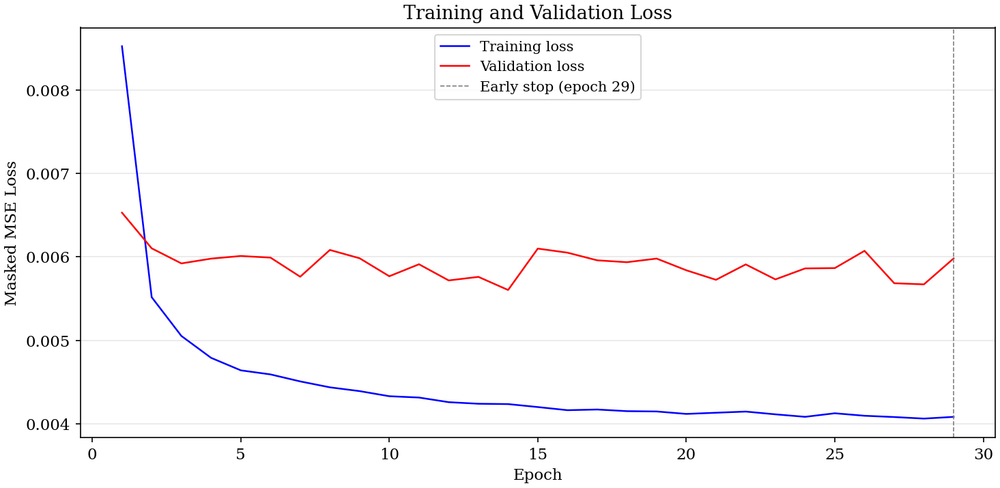

Saved: fig09_training_curves.pdf


In [759]:
# Figure 9: Training curves
if train_losses:
    fig, ax = plt.subplots(figsize=(10, 5))
    epochs_range = range(1, len(train_losses) + 1)
    ax.plot(epochs_range, train_losses, "b-", linewidth=1.2, label="Training loss")
    ax.plot(epochs_range, val_losses, "r-", linewidth=1.2, label="Validation loss")
    if stop_epoch < EPOCHS:
        ax.axvline(stop_epoch, color="gray", linestyle="--", linewidth=0.8,
                   label=f"Early stop (epoch {stop_epoch})")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Masked MSE Loss")
    ax.set_title("Training and Validation Loss")
    ax.legend(fontsize=10)
    ax.grid(axis="y", alpha=0.3)

    fig.tight_layout()
    fig.savefig(FIGURES_DIR / "fig09_training_curves.pdf")
    plt.show()
    print("Saved: fig09_training_curves.pdf")
else:
    print("Model was loaded from file — no training curves to plot.")
    print("Delete model.pt and re-run to generate training curves.")

---
## 8. Standard Inference — Prediction Maps

We run the trained model on the last 3 observed NDMI frames to predict the
next vegetation state. Overlapping patches are averaged in their overlap
regions for a smooth full-frame prediction.

In [760]:
def predict_full_frame(model, ndmi_frames, valid_masks, time_deltas, dist_norm,
                       n_mc=1, use_dropout=False, inference_stride=None):
    """
    Run model on overlapping patches to produce a full-frame prediction.
    Uses inference_stride (default=PATCH_SIZE, i.e. no overlap) for tiling.

    If n_mc > 1 and use_dropout=True, performs Monte Carlo Dropout:
    returns (mean_prediction, std_prediction) arrays.
    Otherwise returns (prediction, None).
    """
    if inference_stride is None:
        inference_stride = PATCH_SIZE  # tile without overlap by default

    T_input = SEQ_LEN - 1  # 3 input frames
    frames = ndmi_frames[-T_input:]
    deltas = time_deltas[-T_input:]

    frames_p = [pad_to_multiple(f, PATCH_SIZE) for f in frames]
    dist_p = pad_to_multiple(dist_norm, PATCH_SIZE)
    pH, pW = frames_p[0].shape

    patch_rows = list(range(0, pH - PATCH_SIZE + 1, inference_stride))
    patch_cols = list(range(0, pW - PATCH_SIZE + 1, inference_stride))
    n_patches = len(patch_rows) * len(patch_cols)
    print(f"  Inference: {n_patches} patches/pass (stride={inference_stride}), {n_mc} MC pass(es)")

    # Accumulators for Welford online mean/variance
    pred_sum = np.zeros((pH, pW), dtype=np.float64)
    pred_sum_sq = np.zeros((pH, pW), dtype=np.float64)
    pred_count = np.zeros((pH, pW), dtype=np.float64)

    if use_dropout:
        model.train()  # activate dropout
    else:
        model.eval()

    with torch.no_grad():
        for mc_run in range(n_mc):
            run_sum = np.zeros((pH, pW), dtype=np.float64)
            run_count = np.zeros((pH, pW), dtype=np.float64)

            for r in patch_rows:
                for c in patch_cols:
                    input_seq = []
                    for t in range(T_input):
                        ndmi_patch = frames_p[t][r:r+PATCH_SIZE, c:c+PATCH_SIZE]
                        delta_ch = np.full_like(ndmi_patch, deltas[t])
                        dist_ch = dist_p[r:r+PATCH_SIZE, c:c+PATCH_SIZE]
                        input_seq.append(np.stack([ndmi_patch, delta_ch, dist_ch], axis=0))
                    input_seq = np.stack(input_seq, axis=0)
                    inp = torch.from_numpy(input_seq).float().unsqueeze(0).to(DEVICE)
                    pred = model(inp).cpu().numpy()[0]
                    run_sum[r:r+PATCH_SIZE, c:c+PATCH_SIZE] += pred
                    run_count[r:r+PATCH_SIZE, c:c+PATCH_SIZE] += 1

            run_count = np.maximum(run_count, 1)
            run_pred = run_sum / run_count

            pred_sum += run_pred
            pred_sum_sq += run_pred ** 2
            pred_count += 1

            print(f"  MC pass {mc_run + 1}/{n_mc} done")

    model.eval()

    mean_pred = (pred_sum / pred_count).astype(np.float32)
    H_orig, W_orig = ndmi_frames[0].shape
    mean_pred = mean_pred[:H_orig, :W_orig]

    if n_mc > 1:
        var_pred = (pred_sum_sq / pred_count) - (pred_sum / pred_count) ** 2
        var_pred = np.maximum(var_pred, 0)
        std_pred = np.sqrt(var_pred).astype(np.float32)[:H_orig, :W_orig]
        return mean_pred, std_pred
    else:
        return mean_pred, None

In [761]:
# Standard (deterministic) inference
print("Running standard inference...")
predicted, _ = predict_full_frame(model, ndmi_frames, valid_masks, time_deltas, dist_norm)
last_observed = ndmi_frames[-1]
last_valid = valid_masks[-1]
delta = predicted - last_observed

print(f"Predicted NDMI: mean={predicted[last_valid].mean():.4f}, "
      f"std={predicted[last_valid].std():.4f}")
print(f"Delta: mean={delta[last_valid].mean():.4f}, "
      f"min={delta[last_valid].min():.4f}, max={delta[last_valid].max():.4f}")

Running standard inference...
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
Predicted NDMI: mean=0.2567, std=0.0691
Delta: mean=0.0020, min=-0.7113, max=0.7023


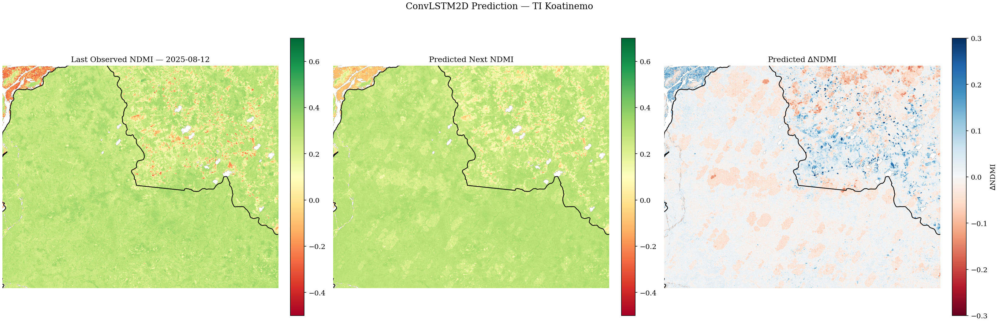

Saved: fig10_prediction_panels.pdf


In [762]:
# Figure 10: 3-panel prediction maps
fig, axes = plt.subplots(1, 3, figsize=(22, 7))

# (a) Last observed
im0 = axes[0].imshow(np.where(last_valid, last_observed, np.nan),
                     cmap="RdYlGn", vmin=-0.5, vmax=0.7)
axes[0].set_title(f"Last Observed NDMI — {dates[-1]}", fontsize=12)
axes[0].axis("off")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# (b) Predicted
im1 = axes[1].imshow(np.where(last_valid, predicted, np.nan),
                     cmap="RdYlGn", vmin=-0.5, vmax=0.7)
axes[1].set_title("Predicted Next NDMI", fontsize=12)
axes[1].axis("off")
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# (c) Change
im2 = axes[2].imshow(np.where(last_valid, delta, np.nan),
                     cmap="RdBu", vmin=-0.3, vmax=0.3)
axes[2].set_title("Predicted $\\Delta$NDMI", fontsize=12)
axes[2].axis("off")
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label="$\\Delta$NDMI")

# Boundary on all panels
for ax in axes:
    for cols, rows in rings_px:
        ax.plot(cols, rows, color="black", linewidth=1.2)
    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)

fig.suptitle("ConvLSTM2D Prediction — TI Koatinemo", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig10_prediction_panels.pdf")
plt.show()
print("Saved: fig10_prediction_panels.pdf")

---
## 9. Certainty-Based Arrow Maps

### 9.1 Monte Carlo Dropout — Uncertainty Estimation

Following Gal & Ghahramani (2016), we approximate Bayesian uncertainty by
running $N = 20$ stochastic forward passes with dropout active at inference
time. The per-pixel **standard deviation** across these passes quantifies
**epistemic uncertainty** — regions where the model is unsure due to limited
or ambiguous training data.

For each arrow on the directional spread map:
- **Direction** is derived from Sobel gradients of the smoothed $\Delta$NDMI field
- **Length** is proportional to **certainty**: $\text{certainty} = \frac{1}{1 + \bar{\sigma}_\text{block}}$

Large arrows indicate confident predictions of deforestation spread direction;
small arrows indicate high uncertainty.

In [763]:
# Monte Carlo Dropout inference
print(f"Running MC Dropout inference ({N_MC} passes)...")
mc_mean, mc_std = predict_full_frame(
    model, ndmi_frames, valid_masks, time_deltas, dist_norm,
    n_mc=N_MC, use_dropout=True
)

print(f"MC mean NDMI: {mc_mean[last_valid].mean():.4f}")
print(f"MC std (uncertainty): mean={mc_std[last_valid].mean():.4f}, "
      f"max={mc_std[last_valid].max():.4f}")

Running MC Dropout inference (10 passes)...
  Inference: 832 patches/pass (stride=64), 10 MC pass(es)
  MC pass 1/10 done
  MC pass 2/10 done
  MC pass 3/10 done
  MC pass 4/10 done
  MC pass 5/10 done
  MC pass 6/10 done
  MC pass 7/10 done
  MC pass 8/10 done
  MC pass 9/10 done
  MC pass 10/10 done
MC mean NDMI: 0.2565
MC std (uncertainty): mean=0.0093, max=0.0700


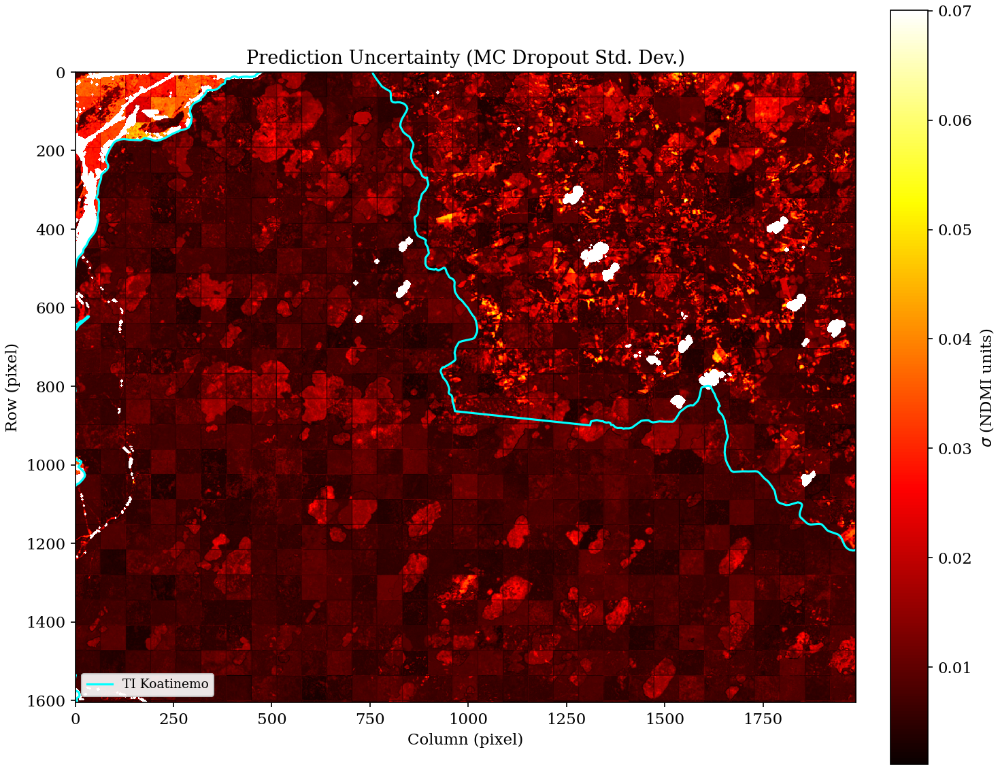

Saved: fig11_uncertainty_map.pdf


In [764]:
# Figure 11: Uncertainty heatmap
fig, ax = plt.subplots(figsize=(10, 8))
uncertainty_display = np.where(last_valid, mc_std, np.nan)
im = ax.imshow(uncertainty_display, cmap="hot", interpolation="nearest")
for cols, rows in rings_px:
    ax.plot(cols, rows, color="cyan", linewidth=1.5)
ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_title("Prediction Uncertainty (MC Dropout Std. Dev.)", fontsize=13)
ax.set_xlabel("Column (pixel)")
ax.set_ylabel("Row (pixel)")
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="$\\sigma$ (NDMI units)")
ax.legend([Line2D([0], [0], color="cyan", lw=1.5)], ["TI Koatinemo"],
          loc="lower left", fontsize=9, framealpha=0.9)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig11_uncertainty_map.pdf")
plt.show()
print("Saved: fig11_uncertainty_map.pdf")

### 9.2 Arrow Map — Predicted Deforestation Spread with Certainty

The arrow map is the central result of this analysis. For each 32×32 pixel
block:
1. We check if at least 32 pixels show predicted NDMI decrease below the
   threshold ($\Delta\text{NDMI} < -0.05$).
2. The **direction** of the arrow is computed from the Sobel gradient of the
   smoothed $\Delta$NDMI field (pointing in the direction of steepest decrease).
3. The **size** (length) of the arrow encodes model certainty:
   higher certainty = larger arrow.
4. The **color** encodes the magnitude of predicted NDMI change (darker red =
   more severe predicted deforestation).

In [765]:
def generate_arrow_data(mean_pred, std_pred, last_observed, last_valid, block_size=BLOCK_SIZE):
    """Compute arrow direction, certainty, and change magnitude per block."""
    delta = mean_pred - last_observed
    deforest = (delta < DELTA_THRESH) & last_valid
    delta_masked = np.where(deforest, delta, 0.0)
    delta_smooth = uniform_filter(delta_masked.astype(np.float64), size=15)

    grad_x = sobel(delta_smooth, axis=1)
    grad_y = sobel(delta_smooth, axis=0)

    H, W = last_observed.shape
    n_rows = H // block_size
    n_cols = W // block_size

    arrow_x = np.zeros((n_rows, n_cols))
    arrow_y = np.zeros((n_rows, n_cols))
    certainty = np.zeros((n_rows, n_cols))
    block_delta = np.zeros((n_rows, n_cols))

    for i in range(n_rows):
        for j in range(n_cols):
            r0, r1 = i * block_size, (i + 1) * block_size
            c0, c1 = j * block_size, (j + 1) * block_size
            block = deforest[r0:r1, c0:c1]
            if block.sum() < block_size:
                continue

            gx = grad_x[r0:r1, c0:c1].mean()
            gy = grad_y[r0:r1, c0:c1].mean()
            mag = np.sqrt(gx**2 + gy**2)
            if mag < 1e-6:
                continue

            arrow_x[i, j] = gx / mag
            arrow_y[i, j] = -gy / mag

            if std_pred is not None:
                block_std = std_pred[r0:r1, c0:c1].mean()
                certainty[i, j] = 1.0 / (1.0 + block_std)
            else:
                certainty[i, j] = 1.0

            block_delta[i, j] = delta[r0:r1, c0:c1].mean()

    return arrow_x, arrow_y, certainty, block_delta, delta


def compute_flow_field(mean_pred, std_pred, last_observed, last_valid):
    """Compute pixel-level flow field (U, V) and certainty for streamplot."""
    delta = mean_pred - last_observed
    deforest = (delta < DELTA_THRESH) & last_valid
    delta_masked = np.where(deforest, delta, 0.0)
    delta_smooth = uniform_filter(delta_masked.astype(np.float64), size=15)

    U = sobel(delta_smooth, axis=1)   # x-gradient
    V = -sobel(delta_smooth, axis=0)  # y-gradient (flipped for image coords)

    # Mask out non-deforesting areas
    mask = ~deforest
    U[mask] = 0
    V[mask] = 0

    # Certainty field (pixel-level)
    if std_pred is not None:
        cert_field = 1.0 / (1.0 + std_pred)
    else:
        cert_field = np.ones_like(mean_pred)
    cert_field[mask] = np.nan

    # Speed (gradient magnitude) for linewidth scaling
    speed = np.sqrt(U**2 + V**2)

    return U, V, cert_field, speed


arrow_x, arrow_y, certainty, block_delta, mc_delta = generate_arrow_data(
    mc_mean, mc_std, last_observed, last_valid
)

# Pixel-level flow field for streamplot
flow_U, flow_V, flow_cert, flow_speed = compute_flow_field(
    mc_mean, mc_std, last_observed, last_valid
)

active = (arrow_x != 0) | (arrow_y != 0)
print(f"Active arrow blocks: {active.sum()} / {active.size}")
if active.any():
    print(f"Certainty range: [{certainty[active].min():.3f}, {certainty[active].max():.3f}]")
    print(f"Mean certainty: {certainty[active].mean():.3f}")
print(f"Flow field speed: max={flow_speed.max():.6f}")

Active arrow blocks: 1317 / 3100
Certainty range: [0.968, 0.996]
Mean certainty: 0.989
Flow field speed: max=0.101622


Full AOI arrows (64px grid): 525
Zoom: rows [0,300], cols [948,1548], arrows: 1317


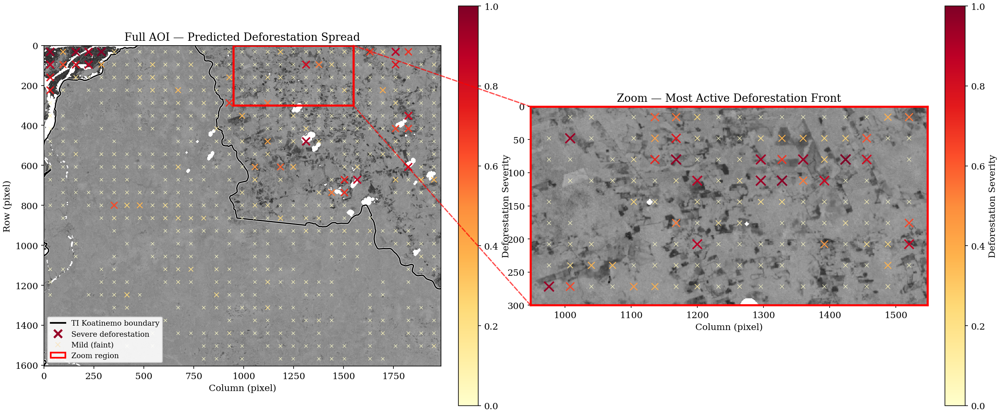

Saved: fig12 & fig13


In [766]:
# Figures 12 & 13: Deforestation spread — arrow grid map
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

arrow_cmap = plt.cm.YlOrRd
cert_norm = Normalize(vmin=0, vmax=1)

def sigmoid_stretch(values):
    """Stretch narrow certainty range using sigmoid for visual contrast."""
    vmin, vmax = values.min(), values.max()
    mid = (vmin + vmax) / 2
    spread = max(vmax - vmin, 1e-8)
    k = 10.0 / spread
    sig = 1.0 / (1.0 + np.exp(-k * (values - mid)))
    sig_min, sig_max = sig.min(), sig.max()
    return (sig - sig_min) / max(sig_max - sig_min, 1e-8)

def draw_markers(ax, arrow_x, arrow_y, certainty, block_delta, block_size,
                 xlim=None, ylim=None, marker_scale=1.0):
    """Draw X markers at grid cell centers.
    Color & alpha driven by deforestation severity (|block_delta|)."""
    active = (arrow_x != 0) | (arrow_y != 0)
    if not active.any():
        return

    yi, xi = np.where(active)
    cx = xi * block_size + block_size // 2
    cy = yi * block_size + block_size // 2
    deltas = np.abs(block_delta[active])

    # Filter to view
    keep = np.ones(len(yi), dtype=bool)
    if xlim:
        keep &= (cx >= xlim[0]) & (cx <= xlim[1])
    if ylim:
        keep &= (cy >= ylim[0]) & (cy <= ylim[1])
    cx, cy, deltas = cx[keep], cy[keep], deltas[keep]
    if len(cx) == 0:
        return

    # Sigmoid stretch severity
    sev = sigmoid_stretch(deltas)
    colors = arrow_cmap(sev)
    sizes = (15 + 80 * sev) * marker_scale

    ax.scatter(cx, cy, marker='x', c=colors, s=sizes,
               linewidths=0.5 + 1.5 * sev, zorder=5)


# ── Generate arrow data: 64px grid for overview, 32px for zoom ──
arrow_x_64, arrow_y_64, cert_64, bdelta_64, _ = generate_arrow_data(
    mc_mean, mc_std, last_observed, last_valid, block_size=64)
print(f"Full AOI arrows (64px grid): {((arrow_x_64 != 0) | (arrow_y_64 != 0)).sum()}")

zoom_block = 32
arrow_xz, arrow_yz, cert_z, bdelta_z, _ = generate_arrow_data(
    mc_mean, mc_std, last_observed, last_valid, block_size=zoom_block)

# ── Zoom region (find densest activity) ──
from scipy.ndimage import uniform_filter as uf
active_z = (arrow_xz != 0) | (arrow_yz != 0)
density = uf(active_z.astype(float), size=10)
peak = np.unravel_index(density.argmax(), density.shape)
crop_half = 300
r0 = max(0, peak[0] * zoom_block - crop_half)
r1 = min(H, peak[0] * zoom_block + crop_half)
c0 = max(0, peak[1] * zoom_block - crop_half)
c1 = min(W, peak[1] * zoom_block + crop_half)
print(f"Zoom: rows [{r0},{r1}], cols [{c0},{c1}], arrows: {active_z.sum()}")

# ── B&W background ──
bg = np.where(last_valid, last_observed, np.nan)
bg_min, bg_max = np.nanmin(bg), np.nanmax(bg)

# ── Figure ──
fig = plt.figure(figsize=(20, 10))
gs = GridSpec(1, 2, width_ratios=[1, 1], wspace=0.12)

# LEFT — full AOI
ax1 = fig.add_subplot(gs[0])
ax1.imshow(bg, cmap="gray", vmin=bg_min, vmax=bg_max, interpolation="nearest")
for c, r in rings_px:
    ax1.plot(c, r, 'k-', lw=1.5,
             path_effects=[pe.Stroke(linewidth=2.5, foreground='white'), pe.Normal()])
draw_markers(ax1, arrow_x_64, arrow_y_64, cert_64, bdelta_64, 64)
ax1.add_patch(Rectangle((c0, r0), c1-c0, r1-r0, lw=2.5, ec='red', fc='none', zorder=10))
ax1.set_xlim(0, W); ax1.set_ylim(H, 0)
ax1.set_title("Full AOI — Predicted Deforestation Spread", fontsize=13)
ax1.set_xlabel("Column (pixel)"); ax1.set_ylabel("Row (pixel)")
sm = ScalarMappable(cmap=arrow_cmap, norm=cert_norm)
sm.set_array([])
fig.colorbar(sm, ax=ax1, fraction=0.046, pad=0.04, label="Deforestation Severity")

# RIGHT — zoom
ax2 = fig.add_subplot(gs[1])
ax2.imshow(bg[r0:r1, c0:c1], cmap="gray", vmin=bg_min, vmax=bg_max,
           interpolation="nearest", extent=[c0, c1, r1, r0])
for c, r in rings_px:
    ax2.plot(c, r, 'k-', lw=2,
             path_effects=[pe.Stroke(linewidth=3, foreground='white'), pe.Normal()])
draw_markers(ax2, arrow_xz, arrow_yz, cert_z, bdelta_z, zoom_block, xlim=(c0,c1), ylim=(r0,r1), marker_scale=1.5)
for sp in ax2.spines.values():
    sp.set_edgecolor('red'); sp.set_linewidth(2.5)
ax2.set_xlim(c0, c1); ax2.set_ylim(r1, r0)
ax2.set_title("Zoom — Most Active Deforestation Front", fontsize=13)
ax2.set_xlabel("Column (pixel)")
fig.colorbar(sm, ax=ax2, fraction=0.046, pad=0.04, label="Deforestation Severity")

# Connection lines
from matplotlib.patches import ConnectionPatch
for (xr,yr),(xa,ya) in [((c1,r0),(c0,r0)), ((c1,r1),(c0,r1))]:
    fig.add_artist(ConnectionPatch(xyA=(xr,yr), coordsA=ax1.transData,
                                   xyB=(xa,ya), coordsB=ax2.transData,
                                   color='red', lw=1.5, ls='--', alpha=0.7))

ax1.legend(handles=[
    Line2D([0],[0], color='k', lw=2, label='TI Koatinemo boundary'),
    Line2D([0],[0], color=arrow_cmap(0.95), ls='None', marker='x', ms=10,
           mew=2.5, label='Severe deforestation'),
    Line2D([0],[0], color=arrow_cmap(0.3), ls='None', marker='x', ms=6,
           mew=1, alpha=0.3, label='Mild (faint)'),
    Rectangle((0,0),1,1, lw=2, ec='red', fc='none', label='Zoom region'),
], loc='lower left', fontsize=9, framealpha=0.9)

fig.savefig(FIGURES_DIR / "fig12_arrow_map.pdf")
fig.savefig(FIGURES_DIR / "fig13_arrow_zoom.pdf")
plt.show()
print("Saved: fig12 & fig13")

Input frames: ['2024-07-16', '2024-07-21', '2024-08-05']
Prediction targets: ['2024-08-20', '2024-08-25', '2024-09-04', '2025-06-16', '2025-08-12']
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
  Step 1 (2024-08-20): MSE=0.002878, MAE=0.0352
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
  Step 2 (2024-08-25): MSE=0.005793, MAE=0.0544
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
  Step 3 (2024-09-04): MSE=0.005440, MAE=0.0459
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
  Step 4 (2025-06-16): MSE=0.003069, MAE=0.0363
  Inference: 832 patches/pass (stride=64), 1 MC pass(es)
  MC pass 1/1 done
  Step 5 (2025-08-12): MSE=0.004867, MAE=0.0410


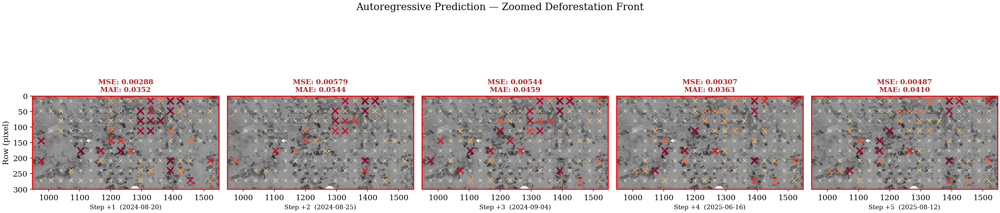

Saved: fig13b_multistep_zoom.pdf


In [767]:
# Figure 13b: Multi-step X-marker predictions in zoomed area
# Shows 5 autoregressive prediction steps with deforestation markers

N_VIS_STEPS = 5
T_input = SEQ_LEN - 1

start_idx = len(ndmi_frames) - T_input - N_VIS_STEPS
input_buffer = [f.copy() for f in ndmi_frames[start_idx:start_idx + T_input]]
ground_truths = ndmi_frames[start_idx + T_input:start_idx + T_input + N_VIS_STEPS]
gt_masks = valid_masks[start_idx + T_input:start_idx + T_input + N_VIS_STEPS]
gt_dates = dates[start_idx + T_input:start_idx + T_input + N_VIS_STEPS]

print(f"Input frames: {dates[start_idx:start_idx + T_input]}")
print(f"Prediction targets: {gt_dates}")

# Autoregressive rollout
step_preds = []
step_mse = []
step_mae = []

model.eval()
current_buf = [f.copy() for f in input_buffer]

for step in range(N_VIS_STEPS):
    pred, _ = predict_full_frame(
        model, current_buf, gt_masks[:1],
        time_deltas[start_idx:start_idx + T_input + step],
        dist_norm, n_mc=1, use_dropout=False
    )
    step_preds.append(pred)

    gt = ground_truths[step]
    mask = gt_masks[step]
    valid = mask & (gt != 0)
    if valid.sum() > 0:
        mse = np.mean((pred[valid] - gt[valid]) ** 2)
        mae = np.mean(np.abs(pred[valid] - gt[valid]))
    else:
        mse, mae = np.nan, np.nan
    step_mse.append(mse)
    step_mae.append(mae)
    print(f"  Step {step+1} ({gt_dates[step]}): MSE={mse:.6f}, MAE={mae:.4f}")

    current_buf.append(pred)
    current_buf = current_buf[-T_input:]

# ── Zoomed panels: 1 row of 5 ──
bg = np.where(last_valid, last_observed, np.nan)
bg_min, bg_max = np.nanmin(bg), np.nanmax(bg)

fig, axes = plt.subplots(1, N_VIS_STEPS, figsize=(4 * N_VIS_STEPS, 5))

zoom_bs = 32  # block size for markers

for step, ax in enumerate(axes):
    # Background: ground truth for this step in the zoom region
    # Use last observed as background (consistent across steps)
    ax.imshow(bg[r0:r1, c0:c1], cmap="gray", vmin=bg_min, vmax=bg_max,
              interpolation="nearest", extent=[c0, c1, r1, r0])

    # Compute deforestation markers for this step
    # Always compare against original last observed frame
    ax_x, ax_y, ax_cert, ax_bd, _ = generate_arrow_data(
        step_preds[step], mc_std, last_observed, last_valid, block_size=zoom_bs
    )

    # Draw X markers in zoom region
    active = (ax_x != 0) | (ax_y != 0)
    if active.any():
        yi, xi = np.where(active)
        cx = xi * zoom_bs + zoom_bs // 2
        cy = yi * zoom_bs + zoom_bs // 2
        deltas = np.abs(ax_bd[active])

        keep = (cx >= c0) & (cx <= c1) & (cy >= r0) & (cy <= r1)
        cx, cy, deltas = cx[keep], cy[keep], deltas[keep]

        if len(cx) > 0:
            sev = sigmoid_stretch(deltas) if len(deltas) > 1 else np.ones_like(deltas)
            colors = arrow_cmap(sev)
            sizes = 15 + 80 * sev
            ax.scatter(cx, cy, marker='x', c=colors, s=sizes,
                       linewidths=0.5 + 1.5 * sev, zorder=5)

    # Boundary
    for c_ring, r_ring in rings_px:
        ax.plot(c_ring, r_ring, 'k-', lw=0.8)

    ax.set_xlim(c0, c1); ax.set_ylim(r1, r0)
    ax.set_title(f"MSE: {step_mse[step]:.5f}\nMAE: {step_mae[step]:.4f}",
                 fontsize=10, color='firebrick', fontweight='bold')
    ax.set_xlabel(f"Step +{step+1}  ({gt_dates[step]})", fontsize=9)
    if step > 0:
        ax.set_yticks([])
    else:
        ax.set_ylabel("Row (pixel)")

    # Red border
    for sp in ax.spines.values():
        sp.set_edgecolor('red'); sp.set_linewidth(1.5)

fig.suptitle("Autoregressive Prediction — Zoomed Deforestation Front", fontsize=14, y=1.02)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig13b_multistep_zoom.pdf", bbox_inches='tight')
plt.show()
print("Saved: fig13b_multistep_zoom.pdf")

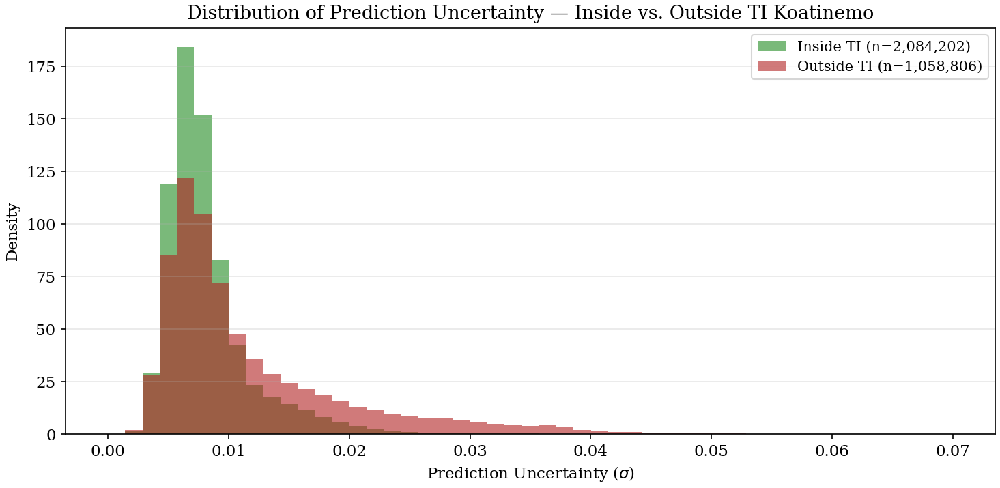

Mean uncertainty inside:  0.00813
Mean uncertainty outside: 0.01167
Saved: fig14_uncertainty_histogram.pdf


In [768]:
# Figure 14: Uncertainty histogram inside vs outside
std_inside = mc_std[last_valid & ti_mask]
std_outside = mc_std[last_valid & ~ti_mask]

fig, ax = plt.subplots(figsize=(10, 5))
bins = np.linspace(0, mc_std[last_valid].max(), 50)
ax.hist(std_inside, bins=bins, alpha=0.6, color="forestgreen", label=f"Inside TI (n={len(std_inside):,})",
        density=True)
ax.hist(std_outside, bins=bins, alpha=0.6, color="firebrick", label=f"Outside TI (n={len(std_outside):,})",
        density=True)
ax.set_xlabel("Prediction Uncertainty ($\\sigma$)")
ax.set_ylabel("Density")
ax.set_title("Distribution of Prediction Uncertainty — Inside vs. Outside TI Koatinemo")
ax.legend(fontsize=10)
ax.grid(axis="y", alpha=0.3)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig14_uncertainty_histogram.pdf")
plt.show()
print(f"Mean uncertainty inside:  {std_inside.mean():.5f}")
print(f"Mean uncertainty outside: {std_outside.mean():.5f}")
print("Saved: fig14_uncertainty_histogram.pdf")

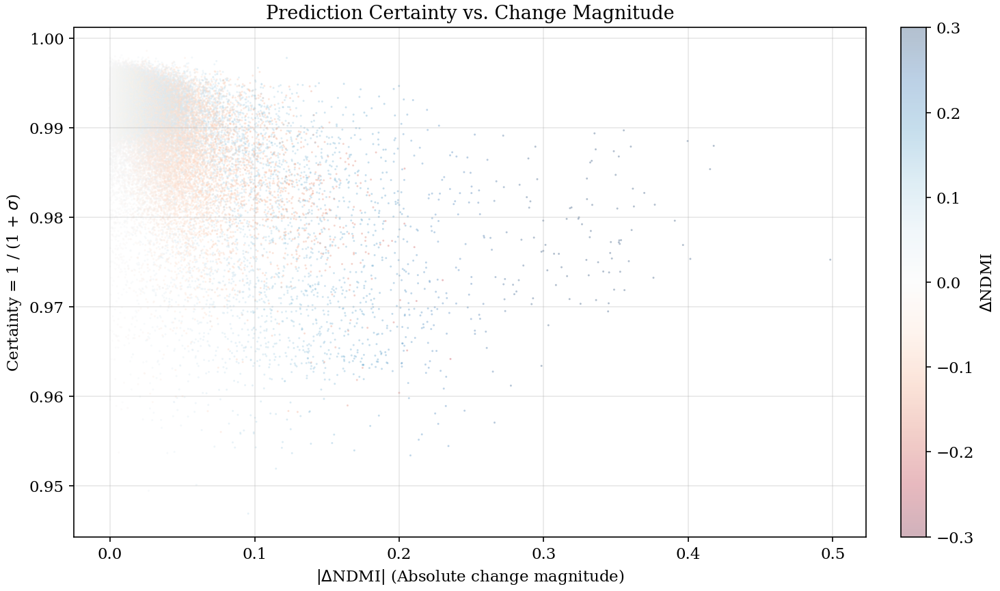

Saved: fig15_certainty_vs_change.pdf


In [769]:
# Figure 15: Certainty vs |delta NDMI| scatter
# Sample for performance
mc_delta_flat = mc_delta[last_valid]
mc_std_flat = mc_std[last_valid]
cert_flat = 1.0 / (1.0 + mc_std_flat)

rng = np.random.RandomState(42)
n_sample = min(50000, len(mc_delta_flat))
idx = rng.choice(len(mc_delta_flat), size=n_sample, replace=False)

fig, ax = plt.subplots(figsize=(10, 6))
sc = ax.scatter(np.abs(mc_delta_flat[idx]), cert_flat[idx],
                c=mc_delta_flat[idx], cmap="RdBu", vmin=-0.3, vmax=0.3,
                s=2, alpha=0.3, edgecolors="none")
ax.set_xlabel("$|\\Delta$NDMI$|$ (Absolute change magnitude)")
ax.set_ylabel("Certainty = 1 / (1 + $\\sigma$)")
ax.set_title("Prediction Certainty vs. Change Magnitude")
fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04, label="$\\Delta$NDMI")
ax.grid(alpha=0.3)

fig.tight_layout()
fig.savefig(FIGURES_DIR / "fig15_certainty_vs_change.pdf")
plt.show()
print("Saved: fig15_certainty_vs_change.pdf")